In [1]:
import pandas as pd
import numpy as np
import feature_selection as fs
import optuna
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import matthews_corrcoef
from catboost import CatBoostClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
import getting_threshold_genes as gtg
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from ydata_profiling import ProfileReport
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import matthews_corrcoef
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Sarcopenia CatBoost

In [2]:
# 1.- get the dataset of experiment Experiment_GSE167186
# 2.- get the dataset of Status_Sarcopenia
# 3.- get the "Sample" from the sarcopenia dataset
# 4.- create a new column in experiment dataset. Is Sample is in the sarcopenia dataset, then "Sarcopenia" else "Healthy"
# 5.- if "Age" is greater than 65, then "Old" else "Young"
# 6.- Use SMOTE to balance the data
# 7.- Use catBoost to classify

In [3]:
#1 
path = "Data/divided_datasets/RNAseq"
experiment = pd.read_csv(f"{path}/Experiment_GSE167186.csv")
#2
sarcopenia = pd.read_csv(f"{path}/Status_Sarcopenia.csv")
#3
sarcopenia_samples = sarcopenia["Sample"]
#4
experiment["Status"] = np.where(experiment["Sample"].isin(sarcopenia_samples), "Sarcopenia", "Healthy")
#5
experiment["Age"] = np.where(experiment["Age"] > 65, "Old", "Young")
experiment

,Sample,ENSG00000000003.14,ENSG00000000005.5,ENSG00000000419.12,ENSG00000000457.13,ENSG00000000460.16,ENSG00000000938.12,ENSG00000000971.15,ENSG00000001036.13,ENSG00000001084.11,...,ENSG00000285471.1,ENSG00000285472.1,ENSG00000285476.1,ENSG00000285480.1,ENSG00000285491.1,ENSG00000285505.1,ENSG00000285508.1,ENSG00000285509.1,Age,Status
0,SRR13758984,-0.018098,-0.039567,-0.004998,-0.033974,-0.035383,-0.037015,-0.021806,-0.029360,-0.023883,...,-0.039049,-0.039010,-0.038975,-0.037070,-0.038994,-0.038958,-0.027188,-0.038851,Old,Sarcopenia
1,SRR13758985,-0.021714,-0.026491,-0.003711,-0.024397,-0.024751,-0.025862,-0.016819,-0.022847,-0.020888,...,-0.026289,-0.026413,-0.026331,-0.026158,-0.026407,-0.026438,-0.022984,-0.026243,Old,Healthy
2,SRR13758986,-0.025526,-0.027849,-0.004777,-0.025392,-0.025384,-0.027021,-0.020357,-0.023013,-0.020575,...,-0.027615,-0.027722,-0.027645,-0.027292,-0.027715,-0.027739,-0.030522,-0.027553,Old,Healthy
3,SRR13758987,-0.013807,-0.025538,-0.004040,-0.023699,-0.023917,-0.025049,-0.018966,-0.022372,-0.019911,...,-0.025359,-0.025495,-0.025410,-0.025362,-0.025489,-0.025526,-0.023519,-0.025324,Old,Sarcopenia
4,SRR13758988,-0.029136,-0.028181,-0.003953,-0.024714,-0.026229,-0.027303,-0.017892,-0.022398,-0.020686,...,-0.027938,-0.028041,-0.027965,-0.027568,-0.028033,-0.028056,-0.024663,-0.027872,Old,Healthy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,SRR13759072,-0.023240,-0.028247,-0.003849,-0.025683,-0.025417,-0.027360,-0.019115,-0.022428,-0.021484,...,-0.028002,-0.028105,-0.028029,-0.027623,-0.028097,-0.028120,-0.029198,-0.027936,Old,Healthy
71,SRR13759073,-0.022928,-0.028686,-0.003947,-0.026005,-0.025341,-0.027735,-0.020587,-0.023651,-0.020937,...,-0.028431,-0.028528,-0.028454,-0.027990,-0.028520,-0.028541,-0.010047,-0.028360,Old,Healthy
72,SRR13759074,-0.022445,-0.028541,-0.004151,-0.025899,-0.025150,-0.027610,-0.018301,-0.023177,-0.020911,...,-0.028289,-0.028388,-0.028313,-0.027868,-0.028380,-0.028401,-0.032209,-0.028219,Young,Healthy
73,SRR13759075,-0.026103,-0.029423,-0.004575,-0.026544,-0.026744,-0.028363,-0.019292,-0.022720,-0.020099,...,-0.029150,-0.029237,-0.029166,-0.028604,-0.029229,-0.029245,-0.026252,-0.029070,Old,Sarcopenia


In [4]:
experiment["Class"]=experiment["Status"].astype(str) + experiment["Age"].astype(str)
experiment

,Sample,ENSG00000000003.14,ENSG00000000005.5,ENSG00000000419.12,ENSG00000000457.13,ENSG00000000460.16,ENSG00000000938.12,ENSG00000000971.15,ENSG00000001036.13,ENSG00000001084.11,...,ENSG00000285472.1,ENSG00000285476.1,ENSG00000285480.1,ENSG00000285491.1,ENSG00000285505.1,ENSG00000285508.1,ENSG00000285509.1,Age,Status,Class
0,SRR13758984,-0.018098,-0.039567,-0.004998,-0.033974,-0.035383,-0.037015,-0.021806,-0.029360,-0.023883,...,-0.039010,-0.038975,-0.037070,-0.038994,-0.038958,-0.027188,-0.038851,Old,Sarcopenia,SarcopeniaOld
1,SRR13758985,-0.021714,-0.026491,-0.003711,-0.024397,-0.024751,-0.025862,-0.016819,-0.022847,-0.020888,...,-0.026413,-0.026331,-0.026158,-0.026407,-0.026438,-0.022984,-0.026243,Old,Healthy,HealthyOld
2,SRR13758986,-0.025526,-0.027849,-0.004777,-0.025392,-0.025384,-0.027021,-0.020357,-0.023013,-0.020575,...,-0.027722,-0.027645,-0.027292,-0.027715,-0.027739,-0.030522,-0.027553,Old,Healthy,HealthyOld
3,SRR13758987,-0.013807,-0.025538,-0.004040,-0.023699,-0.023917,-0.025049,-0.018966,-0.022372,-0.019911,...,-0.025495,-0.025410,-0.025362,-0.025489,-0.025526,-0.023519,-0.025324,Old,Sarcopenia,SarcopeniaOld
4,SRR13758988,-0.029136,-0.028181,-0.003953,-0.024714,-0.026229,-0.027303,-0.017892,-0.022398,-0.020686,...,-0.028041,-0.027965,-0.027568,-0.028033,-0.028056,-0.024663,-0.027872,Old,Healthy,HealthyOld
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,SRR13759072,-0.023240,-0.028247,-0.003849,-0.025683,-0.025417,-0.027360,-0.019115,-0.022428,-0.021484,...,-0.028105,-0.028029,-0.027623,-0.028097,-0.028120,-0.029198,-0.027936,Old,Healthy,HealthyOld
71,SRR13759073,-0.022928,-0.028686,-0.003947,-0.026005,-0.025341,-0.027735,-0.020587,-0.023651,-0.020937,...,-0.028528,-0.028454,-0.027990,-0.028520,-0.028541,-0.010047,-0.028360,Old,Healthy,HealthyOld
72,SRR13759074,-0.022445,-0.028541,-0.004151,-0.025899,-0.025150,-0.027610,-0.018301,-0.023177,-0.020911,...,-0.028388,-0.028313,-0.027868,-0.028380,-0.028401,-0.032209,-0.028219,Young,Healthy,HealthyYoung
73,SRR13759075,-0.026103,-0.029423,-0.004575,-0.026544,-0.026744,-0.028363,-0.019292,-0.022720,-0.020099,...,-0.029237,-0.029166,-0.028604,-0.029229,-0.029245,-0.026252,-0.029070,Old,Sarcopenia,SarcopeniaOld


In [5]:
expression_df = experiment.drop(["Sample", "Status", "Age"], axis=1)

In [6]:
o_y = experiment["Class"]
status = experiment["Status"]

In [7]:
#6
X_status, y_status = fs.smote(X=expression_df.drop(columns=["Class"]), y=status)

Class distribution before SMOTE: Counter({'Healthy': 52, 'Sarcopenia': 23})
Class distribution after SMOTE: Counter({'Sarcopenia': 52, 'Healthy': 52})


In [9]:
extended = pd.concat([X, y], axis=1)
extended

,ENSG00000000003.14,ENSG00000000005.5,ENSG00000000419.12,ENSG00000000457.13,ENSG00000000460.16,ENSG00000000938.12,ENSG00000000971.15,ENSG00000001036.13,ENSG00000001084.11,ENSG00000001167.14,...,ENSG00000285470.1,ENSG00000285471.1,ENSG00000285472.1,ENSG00000285476.1,ENSG00000285480.1,ENSG00000285491.1,ENSG00000285505.1,ENSG00000285508.1,ENSG00000285509.1,Class
0,-0.018098,-0.039567,-0.004998,-0.033974,-0.035383,-0.037015,-0.021806,-0.029360,-0.023883,-0.032784,...,-0.038999,-0.039049,-0.039010,-0.038975,-0.037070,-0.038994,-0.038958,-0.027188,-0.038851,SarcopeniaOld
1,-0.021714,-0.026491,-0.003711,-0.024397,-0.024751,-0.025862,-0.016819,-0.022847,-0.020888,-0.022984,...,-0.026437,-0.026289,-0.026413,-0.026331,-0.026158,-0.026407,-0.026438,-0.022984,-0.026243,HealthyOld
2,-0.025526,-0.027849,-0.004777,-0.025392,-0.025384,-0.027021,-0.020357,-0.023013,-0.020575,-0.024096,...,-0.027742,-0.027615,-0.027722,-0.027645,-0.027292,-0.027715,-0.027739,-0.030522,-0.027553,HealthyOld
3,-0.013807,-0.025538,-0.004040,-0.023699,-0.023917,-0.025049,-0.018966,-0.022372,-0.019911,-0.022313,...,-0.025521,-0.025359,-0.025495,-0.025410,-0.025362,-0.025489,-0.025526,-0.023519,-0.025324,SarcopeniaOld
4,-0.029136,-0.028181,-0.003953,-0.024714,-0.026229,-0.027303,-0.017892,-0.022398,-0.020686,-0.024766,...,-0.028060,-0.027938,-0.028041,-0.027965,-0.027568,-0.028033,-0.028056,-0.024663,-0.027872,HealthyOld
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,-0.025079,-0.023425,-0.004056,-0.022152,-0.022067,-0.023247,-0.019202,-0.020442,-0.019205,-0.021350,...,-0.023491,-0.023297,-0.023459,-0.023366,-0.023599,-0.023455,-0.023503,-0.024007,-0.023286,SarcopeniaOld
80,-0.027820,-0.028814,-0.004405,-0.026885,-0.027032,-0.028759,-0.020591,-0.023331,-0.021629,-0.025786,...,-0.029700,-0.029604,-0.029685,-0.029616,-0.028993,-0.029677,-0.029691,-0.028080,-0.029518,SarcopeniaOld
81,-0.026194,-0.030003,-0.004940,-0.026327,-0.027824,-0.028858,-0.020122,-0.024261,-0.021169,-0.025789,...,-0.029811,-0.029716,-0.029797,-0.029727,-0.029089,-0.029788,-0.029801,-0.025775,-0.029629,SarcopeniaOld
82,-0.025347,-0.030252,-0.004499,-0.027036,-0.028042,-0.029070,-0.020104,-0.024043,-0.020568,-0.026178,...,-0.030050,-0.029959,-0.030036,-0.029968,-0.029297,-0.030027,-0.030039,-0.025582,-0.029869,SarcopeniaOld


In [8]:


def get_selected_genes(csv_file, algorithm):
    if "random_forest" in algorithm:
        df = gtg.get_df_format_RF(csv_file)
    elif "catBoost" in algorithm:
        df = gtg.get_df_format_cat_temporal(csv_file)
    else:
        df = gtg.get_df(csv_file)
    genes = df["Ensembl"]
    return genes

In [9]:
algorithm = "ridge_L2_0"
csv_path = f"Results/feature_selection/RNAseq/{algorithm}/"
file = "Experiment_GSE167186_feature_selection_Symbols.csv"
genes = get_selected_genes(csv_path + file, algorithm)
genes = genes.to_list()

0.03490092380136729


/home/karen/Documents/GitHub/Identify_muscle_age_genes/deep_learning/getting_threshold_genes.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if gene_rank_df.iloc[0][1] == "coef":


In [10]:
len(genes)

1044

In [10]:
#!pip install optuna


In [12]:
def objective(trial):
    # Define hyperparameters to optimize
    params = {
        'iterations': trial.suggest_int('iterations', 50, 500),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
        'depth': trial.suggest_int('depth', 3, 10),
        'random_state': 42,  # Fixed random state
        'verbose': 1  # Fixed verbosity
    }
    
    # Initialize classifier with the suggested hyperparameters
    classifier = CatBoostClassifier(**params)
    
    # Fit the model
    classifier.fit(X_train, y_train)
    
    # Make predictions
    y_pred = classifier.predict(X_test)
    
    # Calculate mcc
    mcc = matthews_corrcoef(y_test, y_pred)

    
    return mcc



In [12]:
#7


o_X = experiment.drop(columns=["Class"])
if 'Unnamed: 0' in genes:
    genes.remove('Unnamed: 0')
# only columns in the selected genes and age
o_X = o_X[genes]
X_train, X_test, y_train, y_test = train_test_split(o_X, o_y, test_size=0.2, random_state=42)

In [13]:
X_status= X_status[genes]
X_train, X_test, y_train, y_test = train_test_split(X_status, y_status, test_size=0.2, random_state=42)

In [ ]:
dived_df = pd.concat([X_train, y_train], axis=1)
dived_df["Class"].describe()

In [14]:
X, y = fs.smote(X=X_train, y=y_train)

Class distribution before SMOTE: Counter({'Healthy': 45, 'Sarcopenia': 38})
Class distribution after SMOTE: Counter({'Sarcopenia': 45, 'Healthy': 45})


In [ ]:
# create more samples for "SarcopeniaOld"


In [15]:
# count how many of each value
y.value_counts()

Status
Sarcopenia    45
Healthy       45
Name: count, dtype: int64

In [ ]:
study = optuna.create_study(direction='maximize')  # Maximize accuracy
study.optimize(objective, n_trials=50 )  # Run 100 trials

# Get the best hyperparameters
best_params = study.best_params
best_params

### all genes

In [16]:


# use optuna to optimize catboost

optuna =  {'iterations': 462, 'learning_rate': 0.05064724346189892, 'depth': 5}
# Initialize classify
classifier = CatBoostClassifier(iterations=462,  # Number of boosting iterations
                              learning_rate=0.05,  # Learning rate
                              depth=5,  # Depth of trees
                              random_state=42,  # Random seed for reproducibility
                              verbose=1)  # Verbosity level (0 - silent, 1 - verbose)

# Fit the model
classifier.fit(X, y)

# Make predictions
y_pred = classifier.predict(X_test)



0:	learn: 0.6614974	total: 83.7ms	remaining: 38.6s
1:	learn: 0.6242688	total: 101ms	remaining: 23.2s
2:	learn: 0.5942111	total: 115ms	remaining: 17.6s
3:	learn: 0.5672690	total: 129ms	remaining: 14.7s
4:	learn: 0.5327446	total: 143ms	remaining: 13.1s
5:	learn: 0.4960015	total: 158ms	remaining: 12s
6:	learn: 0.4713761	total: 170ms	remaining: 11.1s
7:	learn: 0.4493159	total: 184ms	remaining: 10.5s
8:	learn: 0.4328707	total: 200ms	remaining: 10s
9:	learn: 0.4176914	total: 218ms	remaining: 9.87s
10:	learn: 0.3919390	total: 239ms	remaining: 9.81s
11:	learn: 0.3748390	total: 257ms	remaining: 9.64s
12:	learn: 0.3609821	total: 271ms	remaining: 9.35s
13:	learn: 0.3448487	total: 288ms	remaining: 9.21s
14:	learn: 0.3252360	total: 305ms	remaining: 9.08s
15:	learn: 0.3150993	total: 330ms	remaining: 9.19s
16:	learn: 0.3004125	total: 362ms	remaining: 9.46s
17:	learn: 0.2877531	total: 385ms	remaining: 9.5s
18:	learn: 0.2761303	total: 398ms	remaining: 9.28s
19:	learn: 0.2661891	total: 411ms	remaining: 

In [ ]:
# see training curve


In [17]:
importance = classifier.get_feature_importance()
names = classifier.feature_names_
# get importance > 0
importance[importance > 0]

feature_imporance_df = pd.DataFrame(importance, index=names, columns=["importance"])
feature_imporance_df=feature_imporance_df[feature_imporance_df["importance"] > 0]
feature_imporance_df = feature_imporance_df.sort_values(by="importance", ascending=False)

<Axes: title={'center': 'Feature Importance'}>

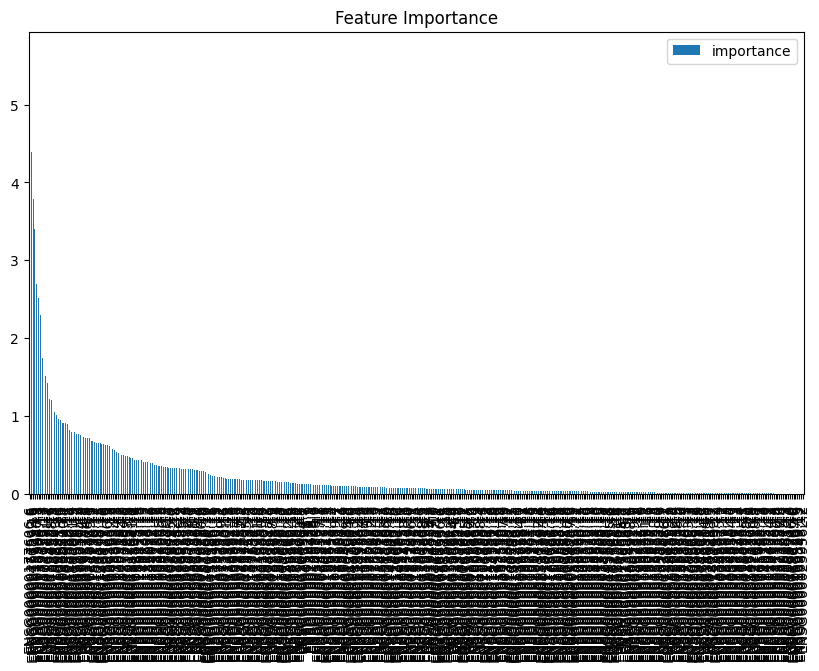

In [19]:
feature_imporance_df.plot(kind='bar', title="Feature Importance", figsize=(10, 6))

In [155]:
feature_imporance_df.to_csv("Results/sarcopenia/feature_importance_Augmented_filter_by_rigde.csv")

In [18]:
feature_imporance_df[:20]

,importance
ENSG00000177606.6,5.655992
ENSG00000257542.5,4.391141
ENSG00000147689.16,3.788447
ENSG00000079739.15,3.403399
ENSG00000253488.1,2.689744
ENSG00000169047.5,2.514306
ENSG00000137700.17,2.294959
ENSG00000179335.18,1.739839
ENSG00000172053.17,1.634882
ENSG00000003989.17,1.517722


In [22]:
top_20_features = feature_imporance_df[:20].index.to_list()
X_top_20 = X[top_20_features]
X_top_20

,ENSG00000177606.6,ENSG00000257542.5,ENSG00000147689.16,ENSG00000079739.15,ENSG00000253488.1,ENSG00000169047.5,ENSG00000137700.17,ENSG00000179335.18,ENSG00000172053.17,ENSG00000003989.17,ENSG00000163171.7,ENSG00000135469.13,ENSG00000154518.9,ENSG00000102030.15,ENSG00000136280.15,ENSG00000102524.11,ENSG00000169083.16,ENSG00000248713.1,ENSG00000108021.20,ENSG00000240590.1
0,0.025410,0.000268,0.083641,-0.002080,0.001175,-0.015308,-0.016190,-0.004696,0.010945,0.016021,-0.016405,0.115149,0.348319,0.012379,-0.011797,-0.020595,-0.016332,-0.002373,-0.012944,-0.010379
1,0.031526,-0.005902,0.040931,-0.001856,0.002028,-0.016164,-0.019966,-0.004702,0.011634,0.018486,-0.019401,0.116214,0.381759,0.011246,-0.012226,-0.016104,-0.018994,-0.002746,-0.017776,-0.017246
2,0.032518,-0.004775,0.051926,-0.004580,0.004560,-0.015338,-0.019246,-0.005377,0.016388,0.017510,-0.017837,0.115649,0.382355,0.009991,-0.012020,-0.019027,-0.018685,-0.003157,-0.014393,-0.013609
3,0.023507,-0.006275,-0.048425,-0.003540,-0.004731,-0.013268,-0.010206,-0.003855,0.011120,0.016753,-0.018605,0.116915,0.393701,0.012274,-0.010938,-0.025540,-0.017985,-0.002689,-0.017687,-0.021448
4,0.026893,-0.002980,0.047931,-0.001748,-0.002291,-0.016560,-0.020448,-0.004973,0.017325,0.015513,-0.014422,0.117258,0.391855,0.012799,-0.010920,-0.023433,-0.017755,-0.002770,-0.017155,-0.017759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,0.027767,-0.003797,0.039000,-0.003626,0.006845,-0.015606,-0.020873,-0.005697,0.012322,0.018249,-0.019987,0.115340,0.372820,0.010812,-0.012382,-0.020210,-0.017899,-0.003406,-0.015589,-0.018240
86,0.034318,-0.005593,0.087339,-0.003809,0.002898,-0.016616,-0.018721,-0.005018,0.015646,0.017820,-0.012681,0.115255,0.386351,0.012051,-0.011715,-0.017739,-0.019465,-0.003924,-0.008820,-0.017589
87,0.029224,-0.006895,0.099411,-0.003076,-0.000040,-0.015974,-0.023603,-0.005056,0.011126,0.017937,-0.012165,0.114620,0.351416,0.011649,-0.012400,-0.021872,-0.017737,-0.002966,-0.009794,-0.023927
88,0.025654,-0.002894,0.342450,-0.002973,0.004786,-0.015450,-0.019068,-0.004899,0.011498,0.016198,-0.017484,0.115100,0.357155,0.011924,-0.011426,-0.014021,-0.018164,-0.002761,-0.015585,-0.006809


In [ ]:
profile = ProfileReport(X_top_20, title="RNA expression data profiling best for sarcopenia report", minimal=True)
profile.to_notebook_iframe()

In [20]:
ensembl= ["ENSG00000177606.6",
"ENSG00000257542.5",
"ENSG00000147689.16",
"ENSG00000079739.15",
"ENSG00000253488.1",
"ENSG00000169047.5",
"ENSG00000137700.17",
"ENSG00000179335.18",
"ENSG00000172053.17",
"ENSG00000003989.17",
"ENSG00000163171.7",
"ENSG00000135469.13",
"ENSG00000154518.9",
"ENSG00000102030.15",
"ENSG00000136280.15",
"ENSG00000102524.11",
"ENSG00000169083.16",
"ENSG00000248713.1",
"ENSG00000108021.20",
"ENSG00000240590.1"]
symbols=["JUN",
"OR7E47P",
"FAM83A",
"PGM1",
"FAM60DP",
"IRS1",
"SLC37A4",
"CLK3",
"QARS",
"SLC7A2",
"CDC42EP3",
"COQ10A",
"ATP5MC3",
"NAA10",
"CCM2",
"TNFSF13B",
"AR",
"AC083902.2",
"FAM208B",
"RPSAP48"]

In [24]:
names_20 = X_top_20.columns.to_list()
column_names = [column if column not in ensembl else symbols[ensembl.index(column)] for column in names_20]
X_top_20.columns = column_names


In [28]:
X_top_20["Age"] = y
X_top_20

/tmp/ipykernel_63046/3649488000.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_top_20["Age"] = y


,JUN,OR7E47P,FAM83A,PGM1,FAM60DP,IRS1,SLC37A4,CLK3,QARS,SLC7A2,...,COQ10A,ATP5MC3,NAA10,CCM2,TNFSF13B,AR,AC083902.2,FAM208B,RPSAP48,Age
0,0.025410,0.000268,0.083641,-0.002080,0.001175,-0.015308,-0.016190,-0.004696,0.010945,0.016021,...,0.115149,0.348319,0.012379,-0.011797,-0.020595,-0.016332,-0.002373,-0.012944,-0.010379,Sarcopenia
1,0.031526,-0.005902,0.040931,-0.001856,0.002028,-0.016164,-0.019966,-0.004702,0.011634,0.018486,...,0.116214,0.381759,0.011246,-0.012226,-0.016104,-0.018994,-0.002746,-0.017776,-0.017246,Healthy
2,0.032518,-0.004775,0.051926,-0.004580,0.004560,-0.015338,-0.019246,-0.005377,0.016388,0.017510,...,0.115649,0.382355,0.009991,-0.012020,-0.019027,-0.018685,-0.003157,-0.014393,-0.013609,Sarcopenia
3,0.023507,-0.006275,-0.048425,-0.003540,-0.004731,-0.013268,-0.010206,-0.003855,0.011120,0.016753,...,0.116915,0.393701,0.012274,-0.010938,-0.025540,-0.017985,-0.002689,-0.017687,-0.021448,Healthy
4,0.026893,-0.002980,0.047931,-0.001748,-0.002291,-0.016560,-0.020448,-0.004973,0.017325,0.015513,...,0.117258,0.391855,0.012799,-0.010920,-0.023433,-0.017755,-0.002770,-0.017155,-0.017759,Healthy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,0.027767,-0.003797,0.039000,-0.003626,0.006845,-0.015606,-0.020873,-0.005697,0.012322,0.018249,...,0.115340,0.372820,0.010812,-0.012382,-0.020210,-0.017899,-0.003406,-0.015589,-0.018240,Sarcopenia
86,0.034318,-0.005593,0.087339,-0.003809,0.002898,-0.016616,-0.018721,-0.005018,0.015646,0.017820,...,0.115255,0.386351,0.012051,-0.011715,-0.017739,-0.019465,-0.003924,-0.008820,-0.017589,Sarcopenia
87,0.029224,-0.006895,0.099411,-0.003076,-0.000040,-0.015974,-0.023603,-0.005056,0.011126,0.017937,...,0.114620,0.351416,0.011649,-0.012400,-0.021872,-0.017737,-0.002966,-0.009794,-0.023927,Sarcopenia
88,0.025654,-0.002894,0.342450,-0.002973,0.004786,-0.015450,-0.019068,-0.004899,0.011498,0.016198,...,0.115100,0.357155,0.011924,-0.011426,-0.014021,-0.018164,-0.002761,-0.015585,-0.006809,Sarcopenia


In [29]:
profile = ProfileReport(X_top_20, title="RNA expression data profiling best for sarcopenia report")


In [30]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
y_pred

array(['Healthy', 'Healthy', 'Sarcopenia', 'Sarcopenia', 'Healthy',
       'Sarcopenia', 'Sarcopenia', 'Healthy', 'Sarcopenia', 'Sarcopenia',
       'Sarcopenia', 'Healthy', 'Sarcopenia', 'Sarcopenia', 'Sarcopenia',
       'Healthy', 'Sarcopenia', 'Sarcopenia', 'Healthy', 'Healthy',
       'Sarcopenia'], dtype=object)

In [22]:
predictions_df = pd.DataFrame({"y_test": y_test, "y_pred": list(y_pred)})
predictions_df

,y_test,y_pred
30,Healthy,Healthy
65,Healthy,Healthy
64,Sarcopenia,Sarcopenia
53,Sarcopenia,Sarcopenia
45,Healthy,Healthy
93,Sarcopenia,Sarcopenia
91,Sarcopenia,Sarcopenia
47,Healthy,Healthy
10,Sarcopenia,Sarcopenia
0,Sarcopenia,Sarcopenia


In [146]:
#evaluate catboost
acc = accuracy_score(y_test, y_pred)
rec = recall_score(y_test, y_pred, average="macro")
pres = precision_score(y_test, y_pred, average="macro")
f2 = f1_score(y_test, y_pred, average="macro")
print(f"Accuracy: {acc} \n Recall: {rec} \n Precision: {pres} \n F1: {f2}")

Accuracy: 0.9523809523809523 
 Recall: 0.9642857142857143 
 Precision: 0.9375 
 F1: 0.9481481481481482


In [147]:

confusion_matrix(y_test, y_pred)

array([[ 7,  0],
       [ 1, 13]])

In [148]:
#mcc
matthews_corrcoef(y_test, y_pred)

0.9013878188659973

### with the original unalteraded

In [178]:
y_pred = classifier.predict(X_status)
acc = accuracy_score(y_status, y_pred)
rec = recall_score(y_status, y_pred, average="macro")
pres = precision_score(y_status, y_pred, average="macro")
f2 = f1_score(y_status, y_pred, average="macro")
print(f"Accuracy: {acc} \n Recall: {rec} \n Precision: {pres} \n F1: {f2}")
confusion_matrix(y_status, y_pred)

Accuracy: 0.9903846153846154 
 Recall: 0.9903846153846154 
 Precision: 0.9905660377358491 
 F1: 0.9903837263060564


array([[52,  0],
       [ 1, 51]])

In [179]:
conf_matrix=confusion_matrix(y_status, y_pred)
conf_matrix

array([[52,  0],
       [ 1, 51]])

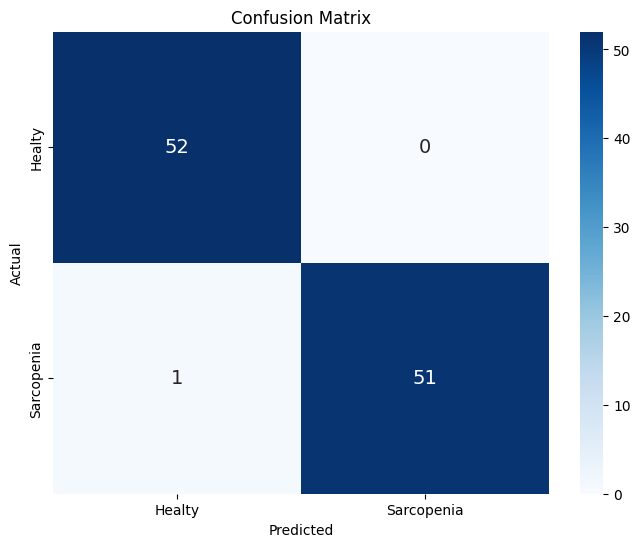

In [180]:


# Plot confusion matrix as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 14},
            xticklabels=["Healty", "Sarcopenia"], yticklabels=["Healty", "Sarcopenia"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## Features

In [150]:

explainer = shap.Explainer(classifier)


In [159]:
len(names)

1044

In [ ]:
ensembl= ["ENSG00000177606.6",
"ENSG00000257542.5",
"ENSG00000147689.16",
"ENSG00000079739.15",
"ENSG00000253488.1",
"ENSG00000169047.5",
"ENSG00000137700.17",
"ENSG00000179335.18",
"ENSG00000172053.17",
"ENSG00000003989.17",
"ENSG00000163171.7",
"ENSG00000135469.13",
"ENSG00000154518.9",
"ENSG00000102030.15",
"ENSG00000136280.15",
"ENSG00000102524.11",
"ENSG00000169083.16",
"ENSG00000248713.1",
"ENSG00000108021.20",
"ENSG00000240590.1"]

In [165]:
len(symnbols)

NameError: name 'symnbols' is not defined

In [ ]:
symbols=["JUN",
"OR7E47P",
"FAM83A",
"PGM1",
"FAM60DP",
"IRS1",
"SLC37A4",
"CLK3",
"QARS",
"SLC7A2",
"CDC42EP3",
"COQ10A",
"ATP5MC3",
"NAA10",
"CCM2",
"TNFSF13B",
"AR",
"AC083902.2",
"FAM208B",
"RPSAP48"]

In [166]:
column_names = [column if column not in ensembl else symbols[ensembl.index(column)] for column in names]
column_names

['ENSG00000185915.5',
 'ENSG00000276045.3',
 'ENSG00000171055.14',
 'ENSG00000177508.11',
 'OR7E47P',
 'ENSG00000111605.16',
 'ENSG00000153130.17',
 'ENSG00000153179.12',
 'ENSG00000168763.15',
 'ENSG00000101892.11',
 'ENSG00000122884.12',
 'ENSG00000139192.11',
 'ENSG00000114854.7',
 'ENSG00000103145.10',
 'ENSG00000149970.15',
 'ENSG00000105048.16',
 'ENSG00000143545.8',
 'ENSG00000187118.13',
 'ENSG00000007944.14',
 'ENSG00000117691.9',
 'ENSG00000005302.17',
 'ENSG00000139350.11',
 'ENSG00000166165.12',
 'AC083902.2',
 'ENSG00000144815.15',
 'ENSG00000172399.5',
 'ENSG00000067177.14',
 'ENSG00000110917.7',
 'ENSG00000103202.12',
 'ENSG00000134333.13',
 'ENSG00000167244.19',
 'ENSG00000163399.15',
 'SLC7A2',
 'ENSG00000022840.15',
 'ENSG00000196141.13',
 'ENSG00000166974.12',
 'ENSG00000116221.15',
 'ENSG00000180304.14',
 'ENSG00000131378.13',
 'ENSG00000125871.13',
 'ENSG00000108861.8',
 'ENSG00000122873.11',
 'ENSG00000015676.17',
 'ENSG00000136279.20',
 'ENSG00000085231.13',
 'EN

In [168]:
df_X_test = pd.DataFrame(X_train, columns=names)
shap_values = explainer.shap_values(df_X_test)

In [158]:
shap.initjs()
shap.plots.force(explainer.expected_value, shap_values[1], df_X_test.iloc[0,:])

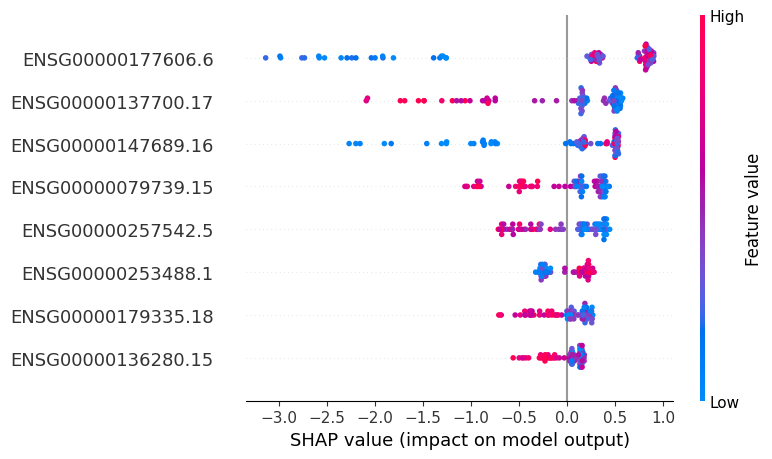

In [176]:
df_X_test = pd.DataFrame(X_train, columns=names)

shap.summary_plot(shap_values, df_X_test, max_display=8)


In [172]:
X_train_df = pd.DataFrame(X_train, columns=column_names) 

shap_values_train = explainer.shap_values(X_train_df)

CatBoostError: /src/catboost/catboost/libs/data/model_dataset_compatibility.cpp:81: At position 4 should be feature with name ENSG00000257542.5 (found OR7E47P).

In [ ]:
profile = ProfileReport(df, title="RNA expression data profiling report", minimal=True)
profile.to_notebook_iframe()

In [128]:
shap_values[0]

array([0., 0., 0., ..., 0., 0., 0.])

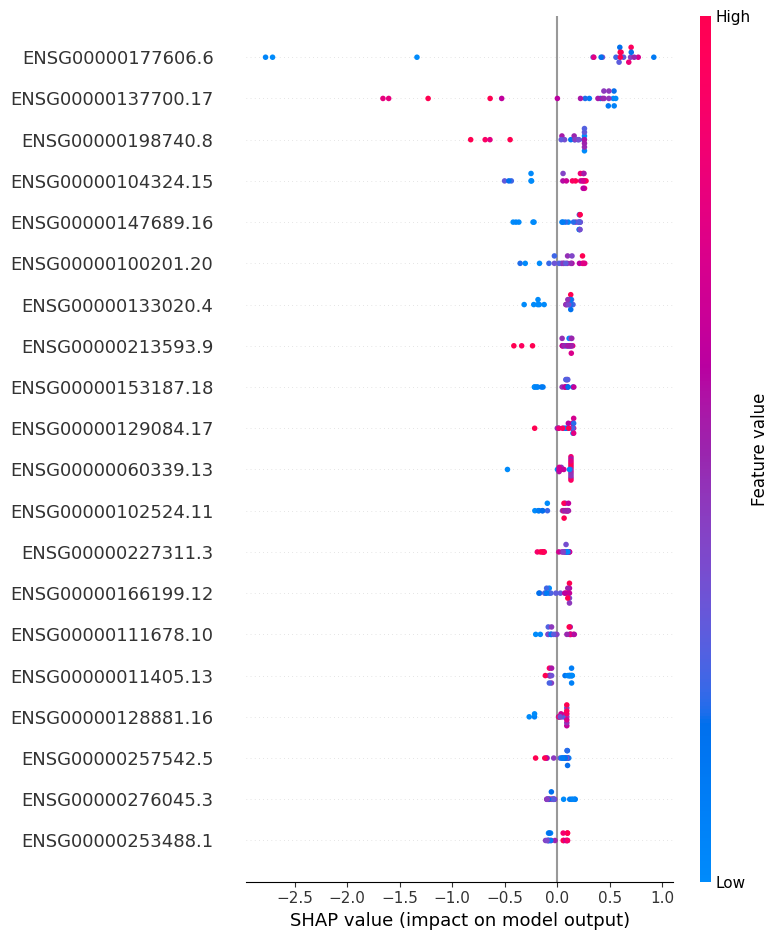

In [91]:
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test)

/tmp/ipykernel_2968309/1966737185.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df["Class"]=y_test


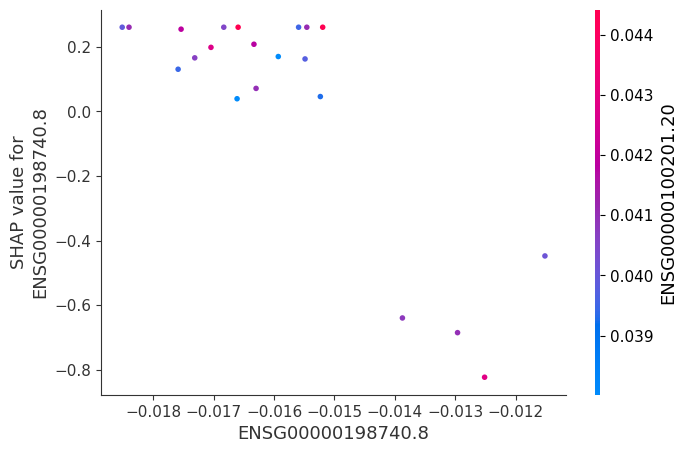

In [110]:
train_df = pd.DataFrame(X_test, columns=names)
train_df["Class"]=y_test
shap.dependence_plot("ENSG00000198740.8", shap_values, X_test, interaction_index="ENSG00000100201.20")

